In [29]:
import os
import glob
import json 
import rtree

import numpy as np
import pandas as pd

import geopandas
import contextily as cx
from shapely.geometry import LineString, Point
from shapely.ops import split, unary_union
import warnings
from shapely.errors import ShapelyDeprecationWarning
warnings.filterwarnings("ignore", category=ShapelyDeprecationWarning) 


from datetime import datetime
from datetime import timedelta

import matplotlib.pyplot as plt
import pytz

## define load bike data functions

In [30]:
def loadBikeDataFileNames(folder):
    bikeFilesName = glob.glob(f'{folder}/*.json')
    bikeFilesName.sort()
    return bikeFilesName

def loadBikeData(bikeDataFileName):
    with open(bikeDataFileName, 'r') as file:
        content = json.load(file)
        bikes = content['countries'][0]['cities'][0]['places']
        bikes = pd.DataFrame(bikes)
        bikes = preprocessBikeData(bikes)
        
        timestamp = bikeDataFileName[-15:-5]
        return bikes, timestamp
    
def preprocessBikeData(df):
    df = df[df['bikes'].apply(lambda x: x>0)] # if not, explode will yield NaN on empty list
    df = df[['lat', 'lng', 'bike_numbers']]
    df = df.explode('bike_numbers')
    
    return df
    
bikeDataFileNames = loadBikeDataFileNames("data/2022.08.28")
bikeData, timestamp = loadBikeData(bikeDataFileNames[0])
bikeData

,lat,lng,bike_numbers
0,52.504157,13.335328,16480
0,52.504157,13.335328,14257
1,52.496986,13.291210,16199
2,52.498323,13.296157,15195
2,52.498323,13.296157,13964
...,...,...,...
2596,52.484333,13.439081,16811
2597,52.518644,13.450926,18122
2598,52.485853,13.360917,16265
2599,52.485782,13.360962,19452


# Load polygons

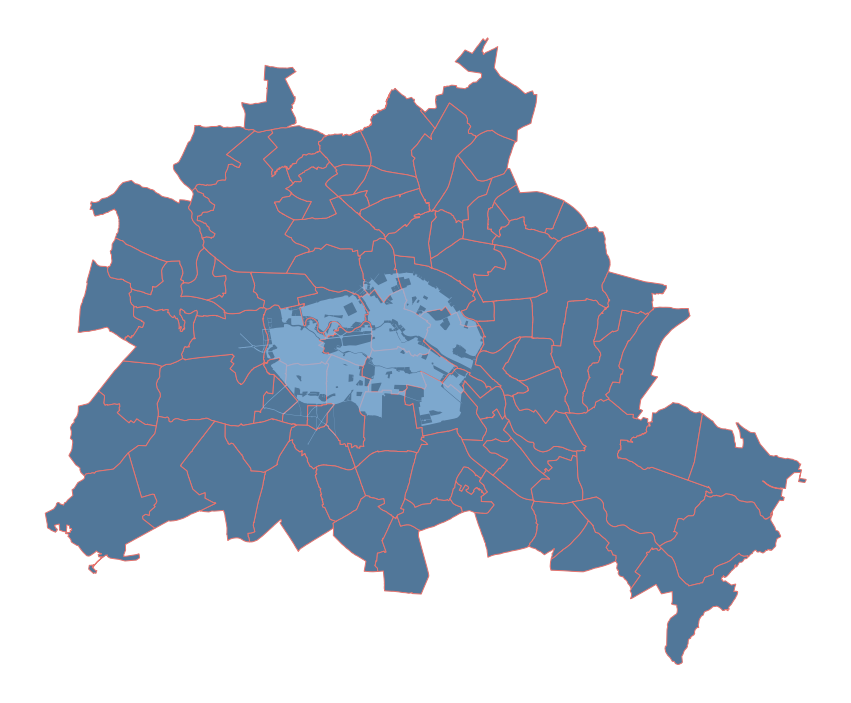

In [31]:
colors = ['#517799', '#E6746F', '#91BDE6', '#E68D2C']

def initKiezePlot(kieze):
    kiezeAx = kieze.plot(color=colors[0], edgecolor=colors[1], figsize=(15,15))
    kiezeAx.set_axis_off();    
    return kiezeAx

def initFlexZonePlot(flexZone, ax=None):
    return flexZone.plot(ax=ax, color=colors[2], alpha=0.7)

kieze = geopandas.read_file("lor_ortsteile.geojson")
kiezeAx = initKiezePlot(kieze)
flexZone = geopandas.read_file("flexzone_bn.json")
flexZoneAx = initFlexZonePlot(flexZone, kiezeAx)

## show only kieze that insersects flexzone

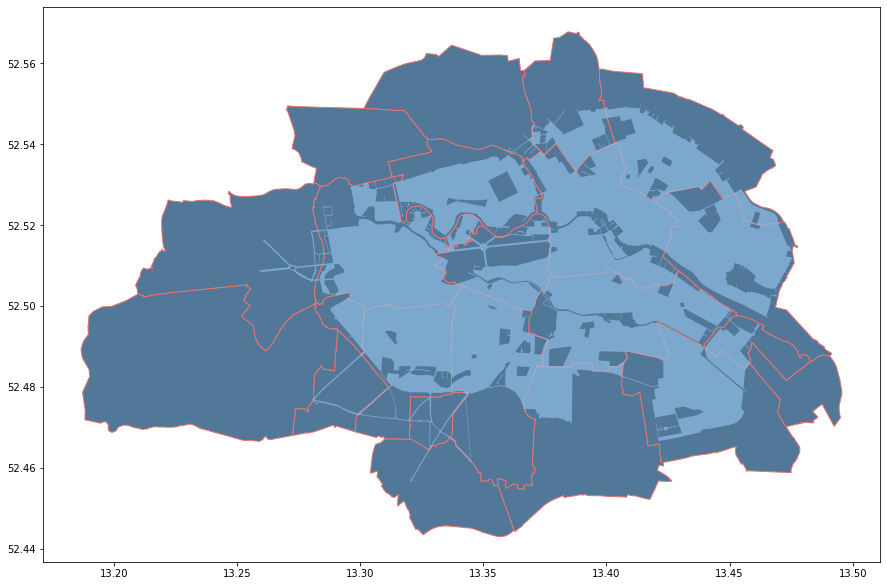

In [32]:
kiezeIntersectingFlexzone = kieze[kieze['gml_id'].isin(kieze.overlay(flexZone, how='intersection')['gml_id'])]
kiezeIntersectingFlexzoneAx = kiezeIntersectingFlexzone.plot(color=colors[0], edgecolor=colors[1], figsize=(15,15))
flexZoneAx = initFlexZonePlot(flexZone, kiezeIntersectingFlexzoneAx)

# Bike locations

In [33]:
def getPointGdfFromLatAndLngDf(df, latName, lngName):
#     df['geometry'] = df.apply(lambda x: Point(x[lngName], x[latName]), axis=1)
    df = df.assign(geometry = df.apply(lambda x: Point(x[lngName], x[latName]), axis=1))
    gdf = geopandas.GeoDataFrame(df, geometry='geometry', crs="EPSG:4326")
    
    return gdf

bikeData, timestamp = loadBikeData(bikeDataFileNames[0])
bikeDataGdf = getPointGdfFromLatAndLngDf(bikeData, 'lat', 'lng')

<AxesSubplot:>

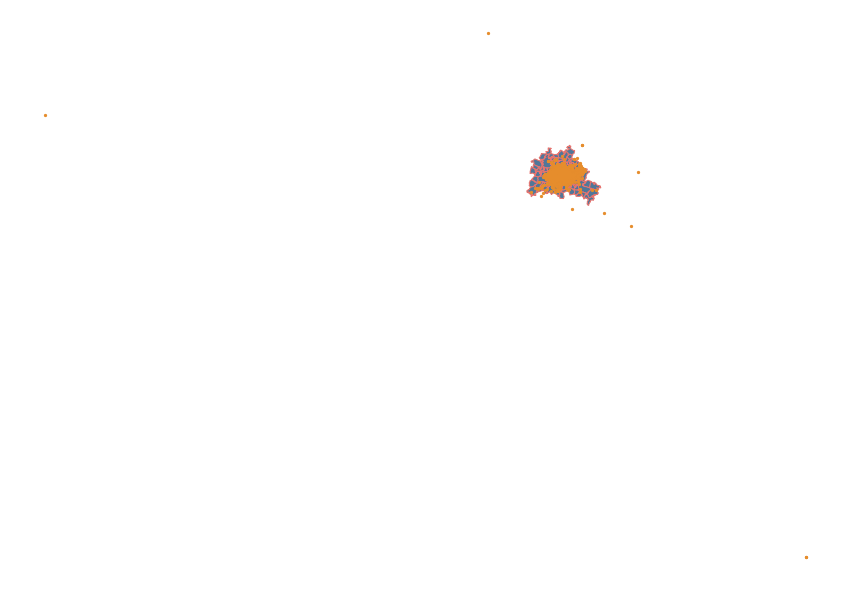

In [34]:
kiezeAx = initKiezePlot(kieze)
flexZoneAx = initFlexZonePlot(flexZone, kiezeAx)
bikeDataGdf.plot(ax=flexZoneAx, color=colors[3], markersize=5)

## need to restrict the locations

### Method 1: box filter around kiezes

<AxesSubplot:>

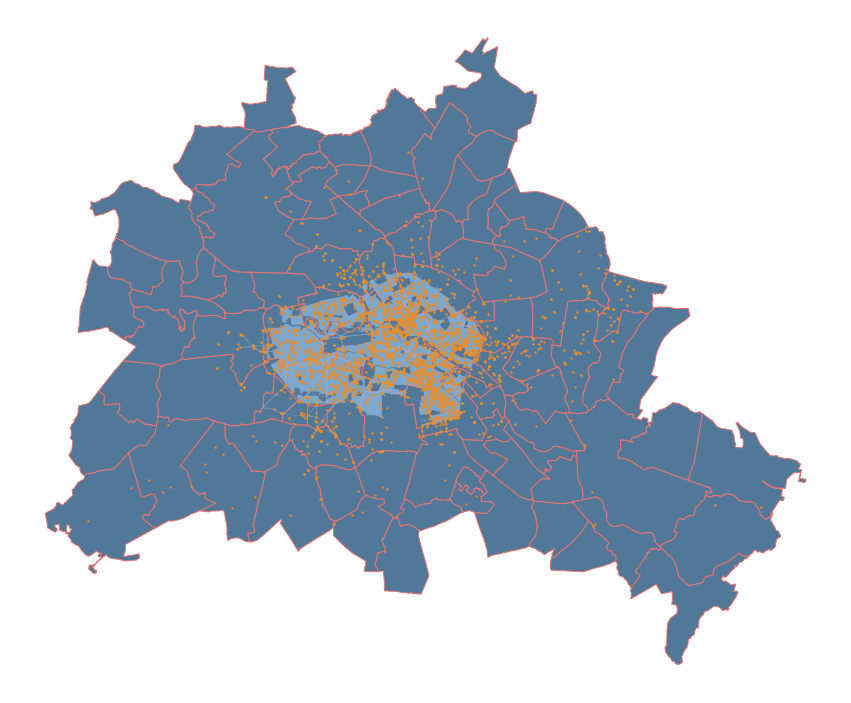

In [35]:
kiezeAx = initKiezePlot(kieze)
flexZoneAx = initFlexZonePlot(flexZone, kiezeAx)
bikeDataGdf.overlay(kieze).plot(ax=flexZoneAx, alpha=1, color=colors[3], markersize=2)

### Method 2: kieze that intersect the flexzone

<AxesSubplot:>

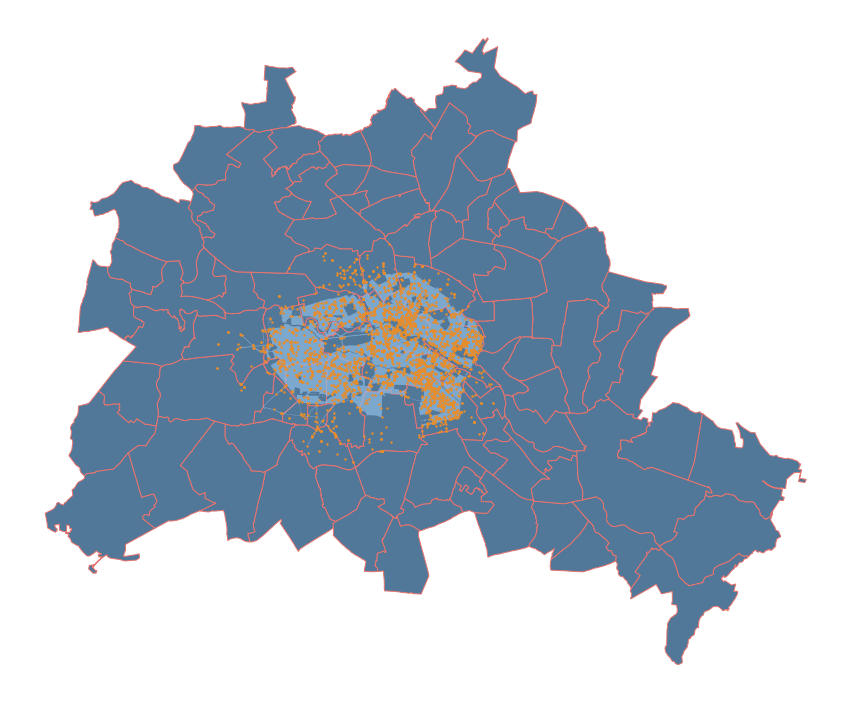

In [36]:
kiezeAx = initKiezePlot(kieze)
flexZoneAx = initFlexZonePlot(flexZone, kiezeAx)
bikeDataGdf.overlay(kiezeIntersectingFlexzone).plot(ax=flexZoneAx, alpha=1, color=colors[3], markersize=2)

#### only show the filtered kieze and bikes

<AxesSubplot:>

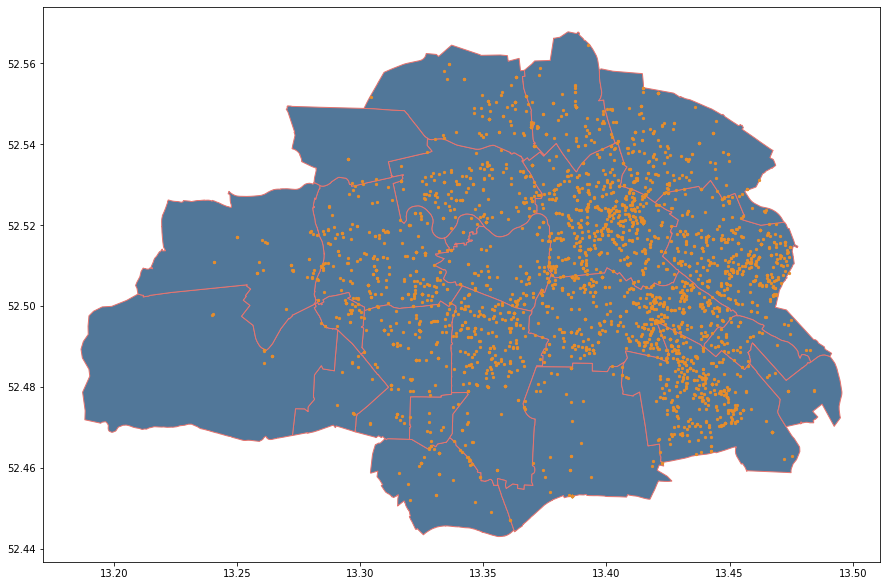

In [37]:
kiezeIntersectingFlexzoneAx = kiezeIntersectingFlexzone.plot(color=colors[0], edgecolor=colors[1], figsize=(15,15))
bikeDataGdf.overlay(kiezeIntersectingFlexzone).plot(ax=kiezeIntersectingFlexzoneAx, alpha=1, color=colors[3], markersize=5)

## plot heatmap of bikes per kiez density

In [38]:
bikeAmount = kiezeIntersectingFlexzone.T.apply(lambda x: bikeDataGdf.within(x['geometry']).sum()).values
bikeDensity = bikeAmount/kiezeIntersectingFlexzone['FLAECHE_HA']

kiezeIntersectingFlexzone = kiezeIntersectingFlexzone.assign(bikeAmount=bikeAmount)
kiezeIntersectingFlexzone = kiezeIntersectingFlexzone.assign(bikeDensity=bikeDensity)
kiezeIntersectingFlexzone.head()

,gml_id,spatial_name,spatial_alias,spatial_type,OTEIL,BEZIRK,FLAECHE_HA,geometry,bikeAmount,bikeDensity
0,re_ortsteil.0101,0101,Mitte,Polygon,Mitte,Mitte,1063.8748,"POLYGON ((13.41649 52.52696, 13.41635 52.52702...",607,0.570556
1,re_ortsteil.0102,0102,Moabit,Polygon,Moabit,Mitte,768.7909,"POLYGON ((13.33884 52.51974, 13.33884 52.51974...",149,0.193811
2,re_ortsteil.0103,0103,Hansaviertel,Polygon,Hansaviertel,Mitte,52.5337,"POLYGON ((13.34322 52.51557, 13.34323 52.51557...",5,0.095177
3,re_ortsteil.0104,0104,Tiergarten,Polygon,Tiergarten,Mitte,516.0672,"POLYGON ((13.36879 52.49878, 13.36891 52.49877...",103,0.199586
4,re_ortsteil.0105,0105,Wedding,Polygon,Wedding,Mitte,919.9112,"POLYGON ((13.34656 52.53879, 13.34664 52.53878...",89,0.096748


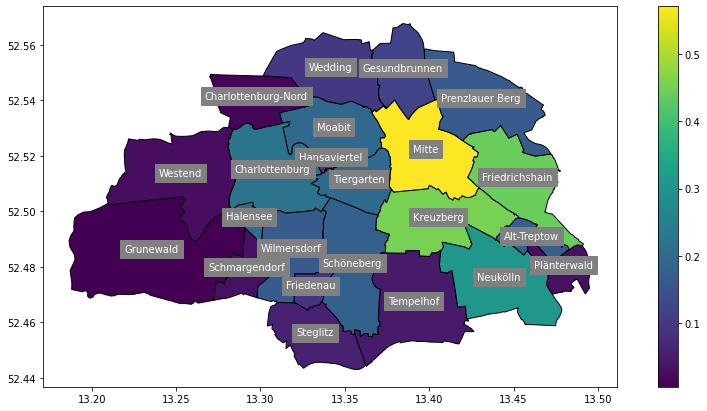

In [39]:
ax = kiezeIntersectingFlexzone.plot(column='bikeDensity', cmap='viridis', edgecolor='k', legend=True, figsize=(15,7))
_ = kiezeIntersectingFlexzone.apply(lambda x: ax.annotate(text=x['OTEIL'], xy=x.geometry.centroid.coords[0], ha='center', color='white', backgroundcolor='grey'), axis=1)

# Bike Tours

In [40]:
def buildBikeTourPairs(bikeData, skip):
    return list(zip(bikeData[::skip][:-1:],bikeData[::skip][1::]))
    
bikeTours = buildBikeTourPairs(bikeDataFileNames, 6)
bikeTours[:2]

[('data/2022.08.28/1661637604.json', 'data/2022.08.28/1661641201.json'),
 ('data/2022.08.28/1661641201.json', 'data/2022.08.28/1661644803.json')]

In [41]:
def getLineString(x):
    return LineString([(x['lng_x'], x['lat_x']), (x['lng_y'], x['lat_y'])])

def createBikeTour(bikeData1, bikeData2, minLength):
    dfMerged = bikeData1.merge(bikeData2, on='bike_numbers')
    dfLines = dfMerged.apply(getLineString, axis=1)
    dfMerged['lines'] = dfLines
    
    gdf = geopandas.GeoDataFrame(dfMerged, geometry='lines', crs="EPSG:4326")
    gdf['length'] = gdf['lines'].to_crs(crs="EPSG:25832").length # first project to meter than get length    
    
    gdf = gdf[gdf['length'] > minLength] # remove bikes that moved under 100 meters
    
    return gdf

def getDateTimeFromTimeStamp(ts):
    return datetime.fromtimestamp(int(ts)).astimezone(pytz.timezone('Europe/Berlin'))

def getTimeFromTimestamp(ts):
    return getDateTimeFromTimeStamp(ts).strftime('%H:%M')

bikes1, ts1 = loadBikeData(bikeTours[13][0])
bikes2, ts2 = loadBikeData(bikeTours[13][1])
bikeTour = createBikeTour(bikes1, bikes2, 100)
bikeTourFiltered = bikeTour[bikeTour.within(unary_union(kiezeIntersectingFlexzone['geometry']))]

startPoints = getPointGdfFromLatAndLngDf(bikeTourFiltered[['lat_x', 'lng_x']], 'lat_x', 'lng_x')
endPoints = getPointGdfFromLatAndLngDf(bikeTourFiltered[['lat_y', 'lng_y']], 'lat_y', 'lng_y')

# Plot 1: bike tours lines

<AxesSubplot:title={'center':'From 13:00 to 14:00'}>

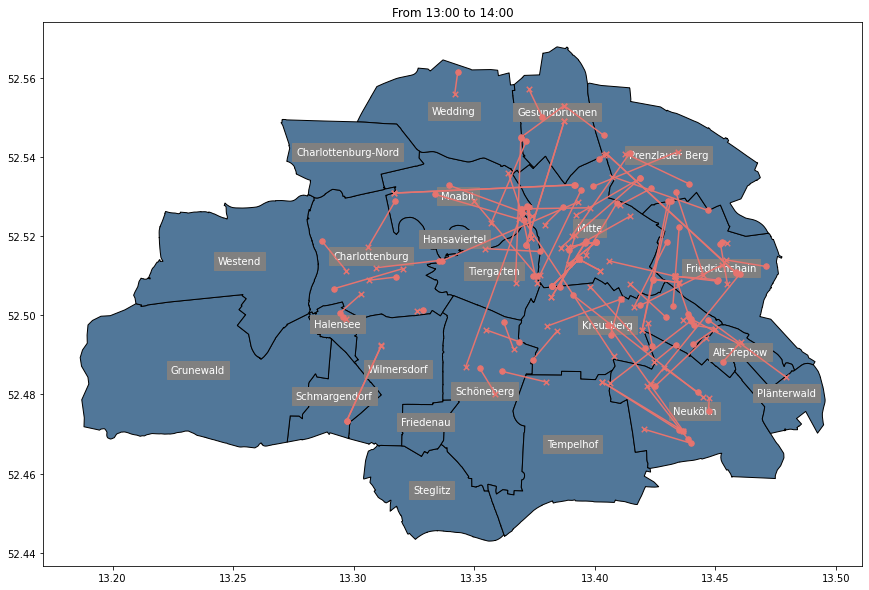

In [42]:
kiezeIntersectingFlexzoneAx = kiezeIntersectingFlexzone.plot(zorder=0,color=colors[0], edgecolor='k', legend=True, figsize=(15,10))
_ = kiezeIntersectingFlexzone.apply(lambda x: kiezeIntersectingFlexzoneAx.annotate(zorder=1, text=x['OTEIL'], xy=x.geometry.centroid.coords[0], ha='center', color='white', backgroundcolor='grey'), axis=1)

bikeTourFilteredAx = bikeTourFiltered.plot(zorder=2, ax=kiezeIntersectingFlexzoneAx, color=colors[1])
bikeTourFilteredAx.set_title(f"From {getTimeFromTimestamp(ts1)} to {getTimeFromTimestamp(ts2)}")

startPointsAx = startPoints.plot(zorder=3, ax=bikeTourFilteredAx, color=colors[1], marker='o', markersize=30)
endPoints.plot(zorder=4, ax=startPointsAx, color=colors[1], marker='x', markersize=30)

<AxesSubplot:title={'center':'From 13:00 to 14:00'}>

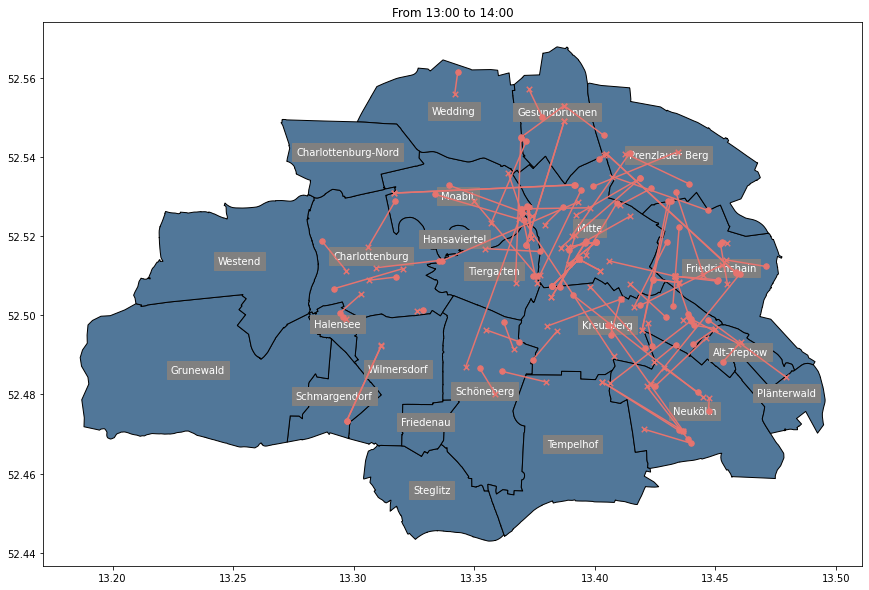

In [43]:
kiezeIntersectingFlexzoneAx = kiezeIntersectingFlexzone.plot(zorder=0,color=colors[0], edgecolor='k', legend=True, figsize=(15,10))
_ = kiezeIntersectingFlexzone.apply(lambda x: kiezeIntersectingFlexzoneAx.annotate(zorder=1, text=x['OTEIL'], xy=x.geometry.centroid.coords[0], ha='center', color='white', backgroundcolor='grey'), axis=1)

bikeTourFilteredAx = bikeTourFiltered.plot(zorder=2, ax=kiezeIntersectingFlexzoneAx, color=colors[1])
bikeTourFilteredAx.set_title(f"From {getTimeFromTimestamp(ts1)} to {getTimeFromTimestamp(ts2)}")

startPointsAx = startPoints.plot(zorder=3, ax=bikeTourFilteredAx, color=colors[1], marker='o', markersize=30)
endPoints.plot(zorder=4, ax=startPointsAx, color=colors[1], marker='x', markersize=30)

# Plot 2: heatmap of touring

In [44]:
kiezeIntersectingFlexzone = kiezeIntersectingFlexzone.assign(tourStart=kiezeIntersectingFlexzone.T.apply(lambda x: startPoints.within(x['geometry']).sum()).values)
kiezeIntersectingFlexzone = kiezeIntersectingFlexzone.assign(tourEnd=kiezeIntersectingFlexzone.T.apply(lambda x: endPoints.within(x['geometry']).sum()).values)
kiezeIntersectingFlexzone = kiezeIntersectingFlexzone.assign(tourSum=(kiezeIntersectingFlexzone['tourStart'] + kiezeIntersectingFlexzone['tourEnd']))

## Tour start

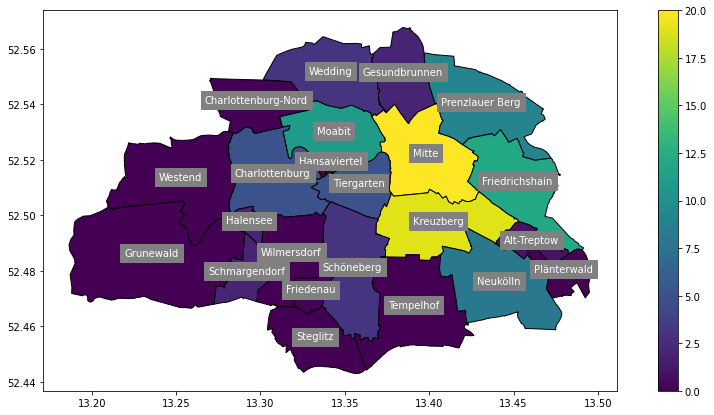

In [45]:
ax = kiezeIntersectingFlexzone.plot(column='tourStart', cmap='viridis', vmax=20, edgecolor='k', legend=True, figsize=(15,7))
_ = kiezeIntersectingFlexzone.apply(lambda x: ax.annotate(text=x['OTEIL'], xy=x.geometry.centroid.coords[0], ha='center', color='white', backgroundcolor='grey'), axis=1)

## tour end

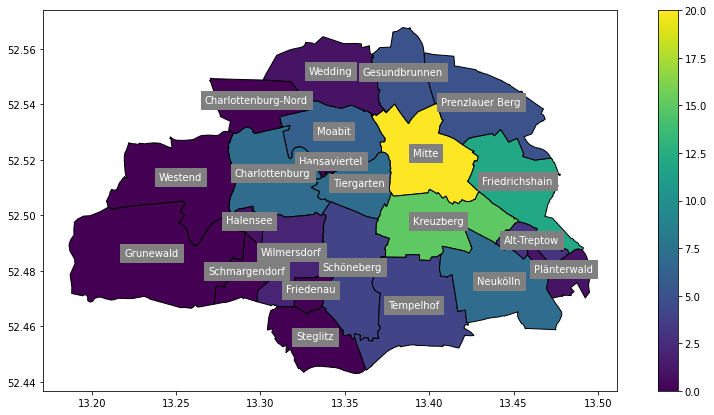

In [46]:
ax =kiezeIntersectingFlexzone.plot(column='tourEnd', cmap='viridis', vmax=20, edgecolor='k', legend=True, figsize=(15,7))
_ = kiezeIntersectingFlexzone.apply(lambda x: ax.annotate(text=x['OTEIL'], xy=x.geometry.centroid.coords[0], ha='center', color='white', backgroundcolor='grey'), axis=1)

## tour sum

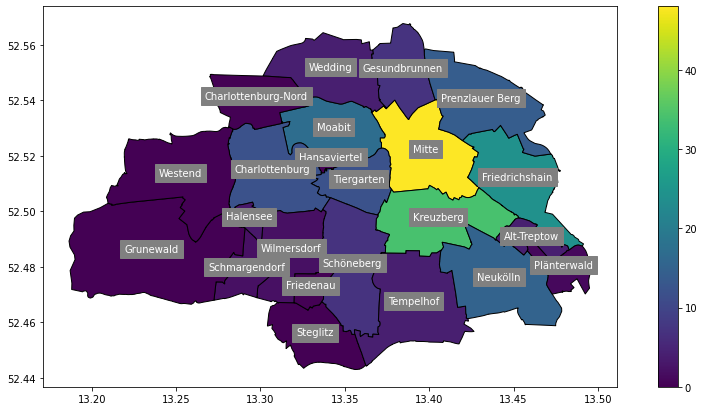

In [47]:
ax =kiezeIntersectingFlexzone.plot(column='tourSum', cmap='viridis', edgecolor='k', legend=True, figsize=(15,7))
_ = kiezeIntersectingFlexzone.apply(lambda x: ax.annotate(text=x['OTEIL'], xy=x.geometry.centroid.coords[0], ha='center', color='white', backgroundcolor='grey'), axis=1)

# Plot 3: heatmap by start and stop split

<AxesSubplot:>

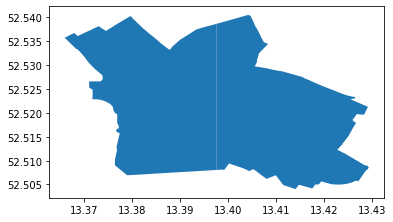

In [48]:
def isSplittedPolygonOnTheLeft(splittedPolygon, polygon):
    return splittedPolygon.bounds[0] == polygon.bounds[0]

def splitPolygonIntoHalf(p):
    minx, miny, maxx, maxy = p.bounds
    splitterx = minx + (maxx-minx)/2
    splitter = LineString([[splitterx, miny], [splitterx, maxy]])

    splittedPolygon = split(p, splitter)
    
    if(isSplittedPolygonOnTheLeft(splittedPolygon.geoms[0], splittedPolygon)):
        return geopandas.GeoSeries([splittedPolygon.geoms[0], splittedPolygon.geoms[1]])
    else:
        return geopandas.GeoSeries([splittedPolygon.geoms[1], splittedPolygon.geoms[0]])
    

splitPolygonIntoHalf(kiezeIntersectingFlexzone['geometry'].iloc[0]).plot()

## problem with one polygon

<AxesSubplot:>

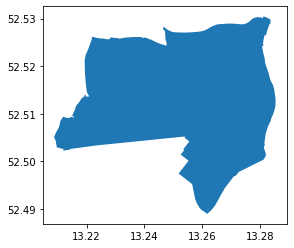

In [49]:
kiezeIntersectingFlexzone.loc[25:25].plot() # original

<AxesSubplot:>

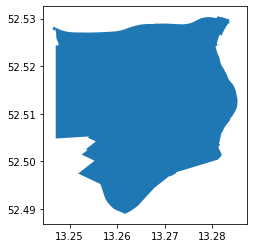

In [50]:
faultyPolygon = splitPolygonIntoHalf(kiezeIntersectingFlexzone['geometry'].loc[25])
faultyPolygon.plot()

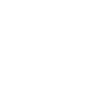

In [51]:
faultyPolygon[0]

In [52]:
print(faultyPolygon[0])

POLYGON ((13.24707419926635 52.5273623297785, 13.247069207254091 52.52737115214868, 13.247046290181563 52.52740212285497, 13.247021070989664 52.52743242077715, 13.246991412059765 52.52746118419698, 13.246959623863546 52.52748908879089, 13.246923782539975 52.52751510232846, 13.24688601439824 52.527540099304005, 13.24684465306203 52.527562882776316, 13.246801623230015 52.52758448626836, 13.246755531610269 52.52760359675062, 13.24670805244819 52.527621398900294, 13.246658100713464 52.52763647559928, 13.246562847578733 52.527659606624844, 13.246499838652138 52.52767127984153, 13.246435239123254 52.52767907494787, 13.246342015986535 52.52768893019432, 13.246352023567553 52.52770737580036, 13.246388732138362 52.527775090605694, 13.246396607581023 52.52778962020635, 13.24641766687021 52.52782846484415, 13.246578615375943 52.52812529543564, 13.246680708352573 52.52831361294615, 13.246928001673572 52.52817384806656, 13.247041171563687 52.5281099123752, 13.247060657620079 52.52809889446365, 13.2

## split all kieze

In [53]:
splittedKieze = kiezeIntersectingFlexzone.apply(lambda x: splitPolygonIntoHalf(x['geometry']), axis=1)

leftSplitKieze = kiezeIntersectingFlexzone.assign(leftSplit=splittedKieze[0])
leftSplitKieze.set_geometry('leftSplit', inplace=True)

rightSplitKieze = kiezeIntersectingFlexzone.assign(rightSplit=splittedKieze[1])
rightSplitKieze.set_geometry('rightSplit', inplace=True)

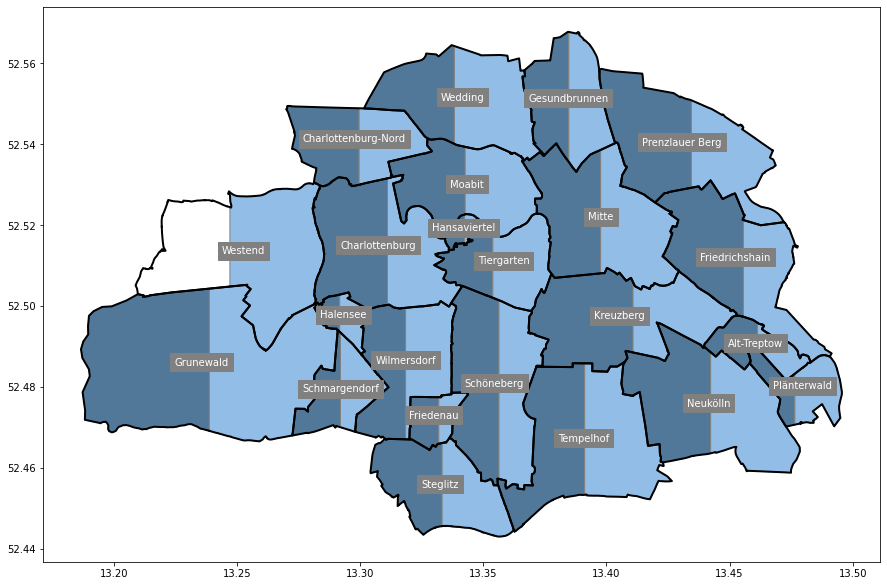

In [54]:
leftSplitAx = leftSplitKieze.plot(color=colors[0], edgecolor='grey', figsize=(15,15))
rightSplitAx = rightSplitKieze.plot(ax = leftSplitAx, color=colors[2], edgecolor='grey')

kiezeBorderAx = kiezeIntersectingFlexzone.plot(ax = rightSplitAx, facecolor=(0,0,0,0), edgecolor='k', linewidth=2)
_ = kiezeIntersectingFlexzone.apply(lambda x: kiezeBorderAx.annotate(text=x['OTEIL'], xy=x.geometry.centroid.coords[0], ha='center', color='white', backgroundcolor='grey'), axis=1)

## feeding data

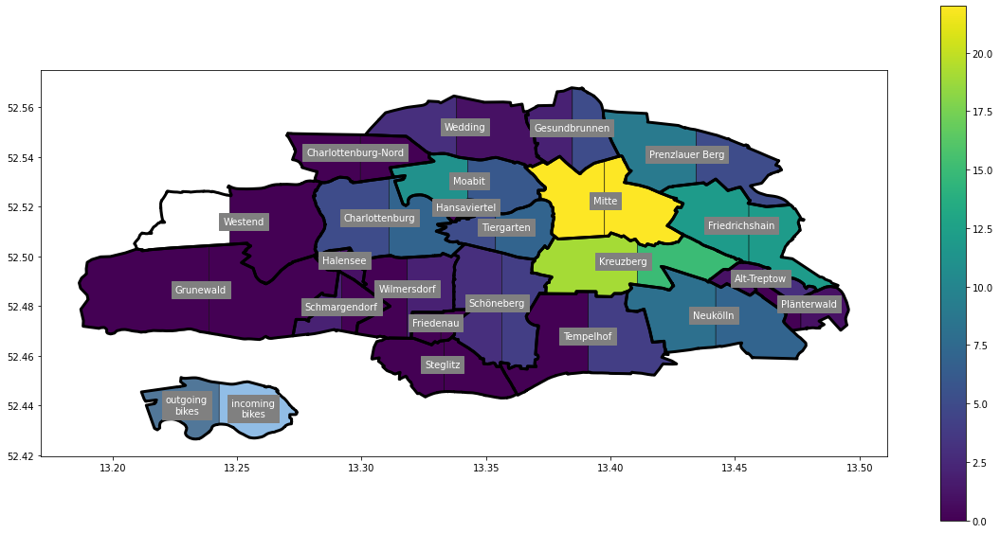

In [55]:
leftSplitKieze = leftSplitKieze.assign(tourStartLeftSplitKieze=leftSplitKieze.T.apply(lambda x: startPoints.within(x['geometry']).sum()).values)
rightSplitKieze = rightSplitKieze.assign(tourStartRigthSplitKieze=rightSplitKieze.T.apply(lambda x: endPoints.within(x['geometry']).sum()).values)

exampleSplit = geopandas.GeoSeries([leftSplitKieze.loc[1]['leftSplit'], rightSplitKieze.loc[1]['rightSplit']])
exampleSplit = exampleSplit.translate(xoff=-0.1, yoff=-0.09)


leftSplitAx = leftSplitKieze.plot(column='tourStartLeftSplitKieze', cmap='viridis', vmax=22, edgecolor='k', linewidth=0.5, legend=True, figsize=(20,10))
rightSplitAx = rightSplitKieze.plot(ax = leftSplitAx, column='tourStartRigthSplitKieze', cmap='viridis', vmax=22, edgecolor='k', linewidth=0.5)
kiezeBorderAx = kiezeIntersectingFlexzone.plot(ax = rightSplitAx, facecolor=(0,0,0,0), edgecolor='k', linewidth=3)
_ = kiezeIntersectingFlexzone.apply(lambda x: kiezeBorderAx.annotate(text=x['OTEIL'], xy=x.geometry.centroid.coords[0], ha='center', color='white', backgroundcolor='grey'), axis=1)


exampleSplitLeftAx = exampleSplit[0:1].plot(ax=kiezeBorderAx, color=colors[0], edgecolor='k', linewidth=0.5)
exampleSplitRightAx = exampleSplit[1:2].plot(ax=kiezeBorderAx, color=colors[2], edgecolor='k', linewidth=0.5)
_ = geopandas.GeoSeries(unary_union(exampleSplit)).plot(ax=kiezeBorderAx, facecolor=(0,0,0,0), edgecolor='k', linewidth=3)
_ = exampleSplitLeftAx.annotate(text='outgoing\nbikes', xy=exampleSplit[0].centroid.coords[0], ha='center', va='center',  color='white', backgroundcolor='grey')
_ = exampleSplitLeftAx.annotate(text='incoming\nbikes', xy=exampleSplit[1].centroid.coords[0], ha='center', va='center', color='white', backgroundcolor='grey')

# mass production

In [56]:
stop()

NameError: name 'stop' is not defined

### bike tour lines

/home/kang/uni/proceed-bpms-new-scalable-architecture-test/venv-iosl-proceed/lib/python3.10/site-packages/geopandas/plotting.py:673: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


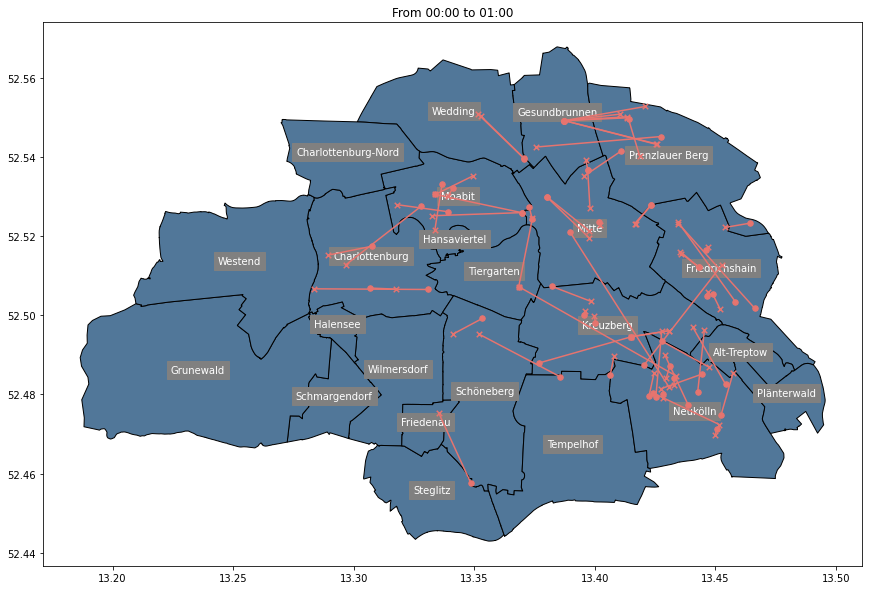

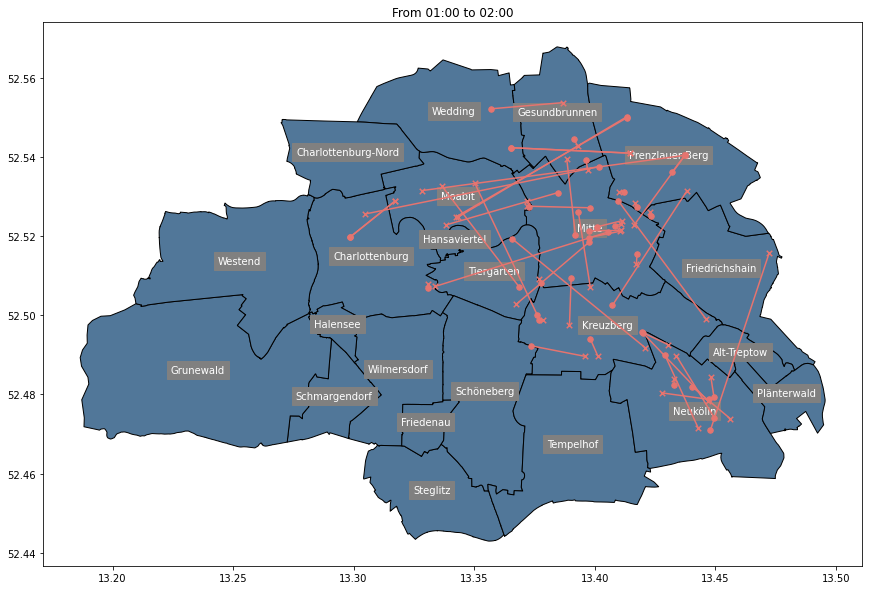

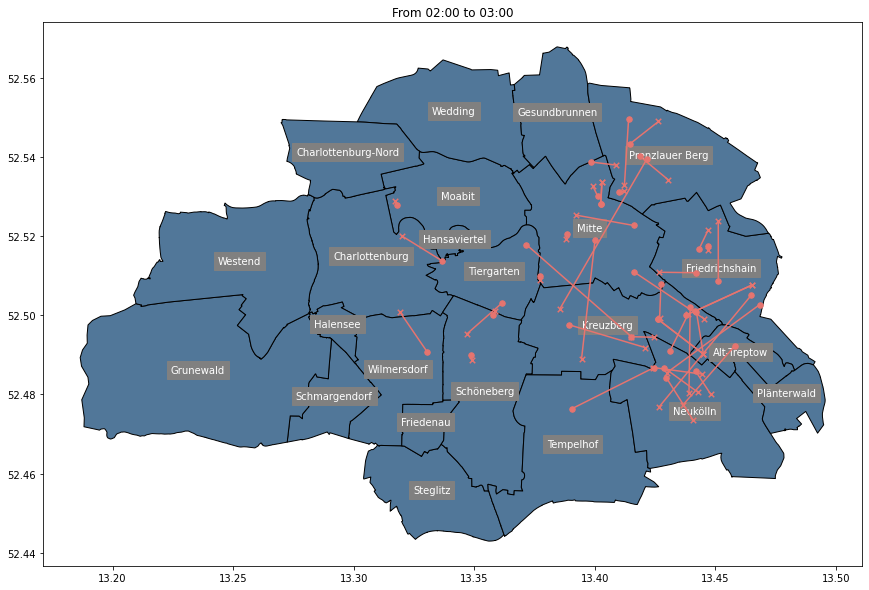

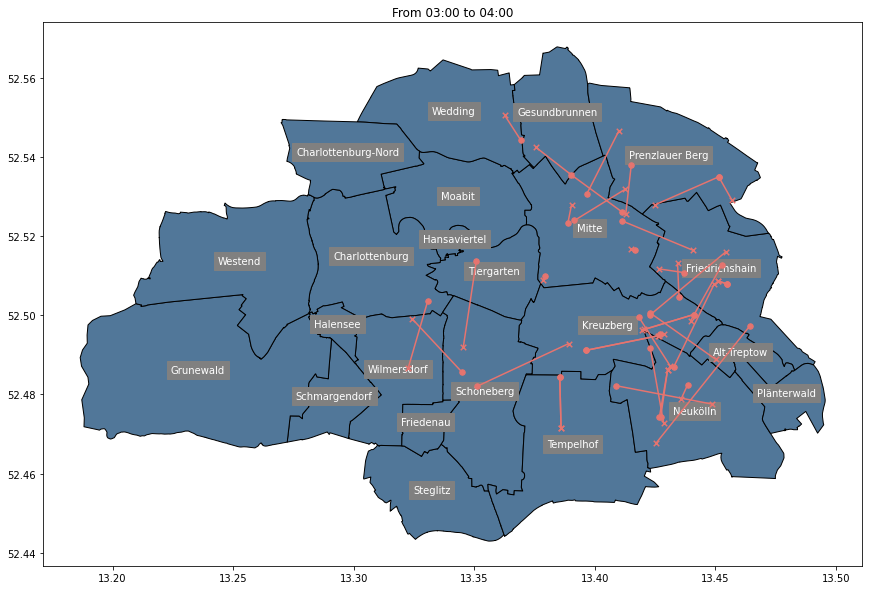

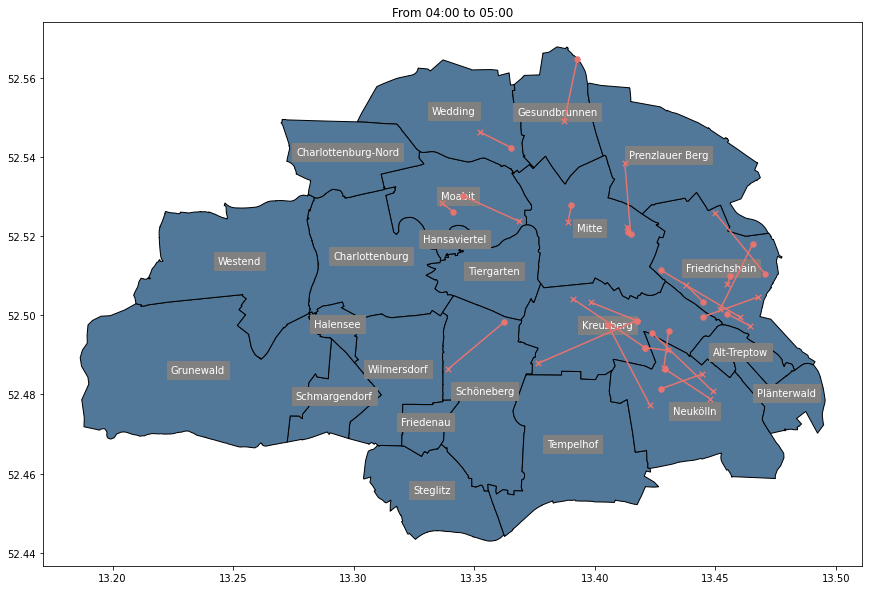

...

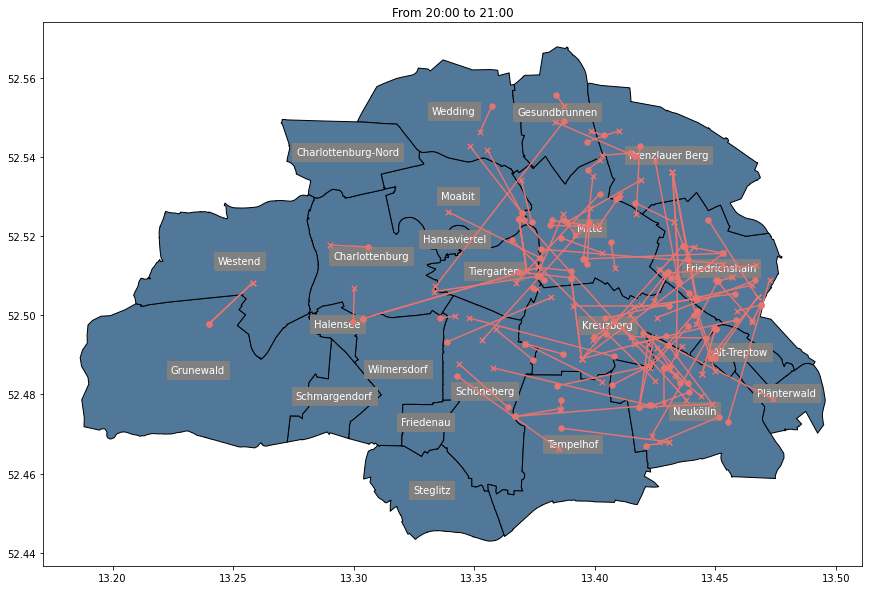

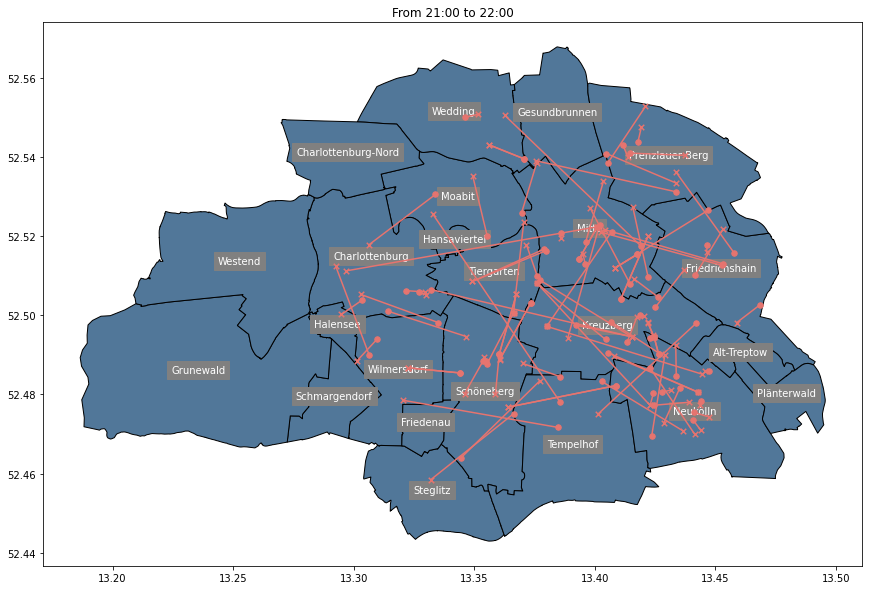

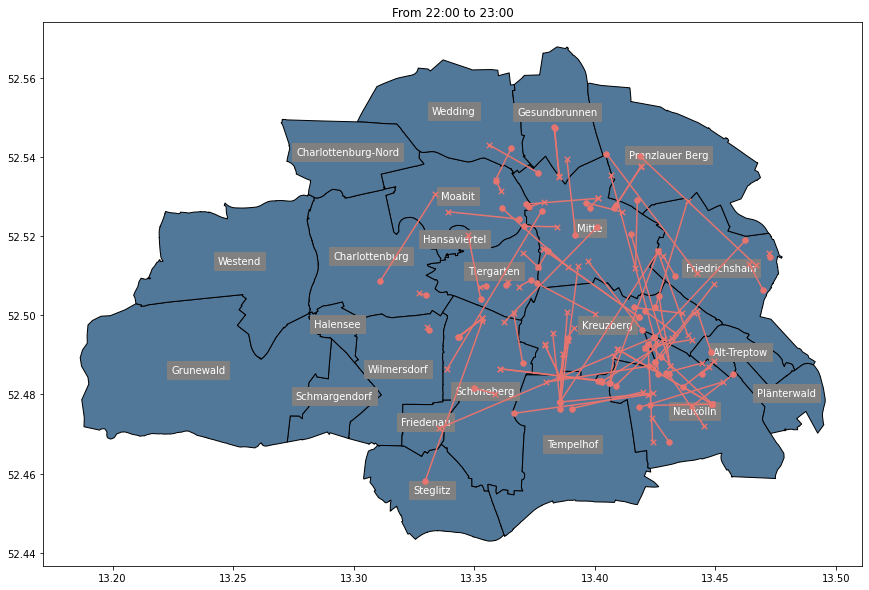

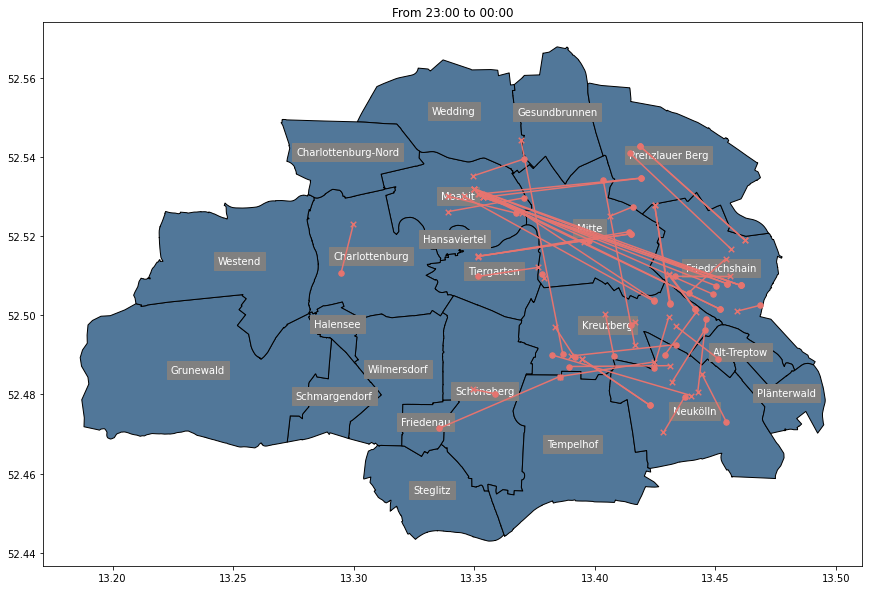

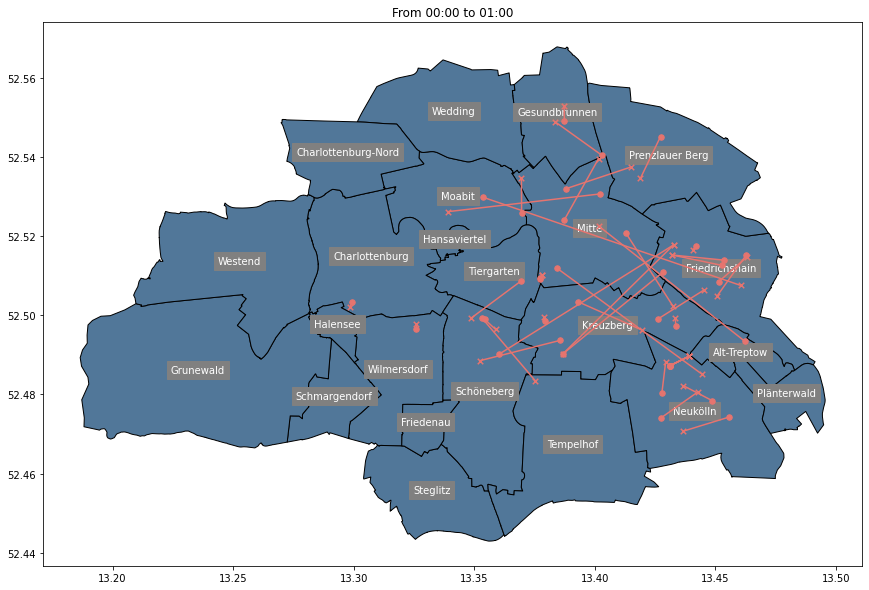

In [61]:
bikeTours = buildBikeTourPairs(bikeDataFileNames, 6)
# bikeTours = bikeTours[:2]

for bikeTour in bikeTours:
    bikes1, ts1 = loadBikeData(bikeTour[0])
    bikes2, ts2 = loadBikeData(bikeTour[1])
    bikeTour = createBikeTour(bikes1, bikes2, 100)
    bikeTourFiltered = bikeTour[bikeTour.within(unary_union(kiezeIntersectingFlexzone['geometry']))]

    
    startPoints = getPointGdfFromLatAndLngDf(bikeTourFiltered[['lat_x', 'lng_x']], 'lat_x', 'lng_x')
    endPoints = getPointGdfFromLatAndLngDf(bikeTourFiltered[['lat_y', 'lng_y']], 'lat_y', 'lng_y')
    
    # plot
    kiezeIntersectingFlexzoneAx = kiezeIntersectingFlexzone.plot(zorder=0,color=colors[0], edgecolor='k', legend=True, figsize=(15,10))
    _ = kiezeIntersectingFlexzone.apply(lambda x: kiezeIntersectingFlexzoneAx.annotate(zorder=1, text=x['OTEIL'], xy=x.geometry.centroid.coords[0], ha='center', color='white', backgroundcolor='grey'), axis=1)

    bikeTourFilteredAx = bikeTourFiltered.plot(zorder=2, ax=kiezeIntersectingFlexzoneAx, color=colors[1])
    bikeTourFilteredAx.set_title(f"From {getTimeFromTimestamp(ts1)} to {getTimeFromTimestamp(ts2)}")

    startPointsAx = startPoints.plot(zorder=3, ax=bikeTourFilteredAx, color=colors[1], marker='o', markersize=30)
    endPoints.plot(zorder=4, ax=startPointsAx, color=colors[1], marker='x', markersize=30)

    
    plt.savefig(f"export/60_min_tick_tourline/{getTimeFromTimestamp(ts1)}-{getTimeFromTimestamp(ts2)}")


### bike tour heatmap

/home/kang/uni/proceed-bpms-new-scalable-architecture-test/venv-iosl-proceed/lib/python3.10/site-packages/geopandas/plotting.py:673: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


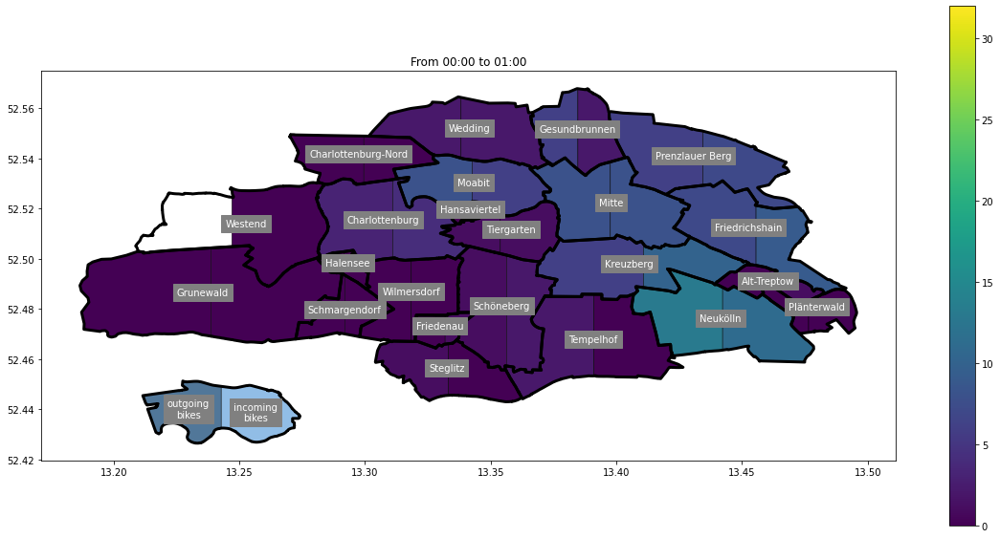

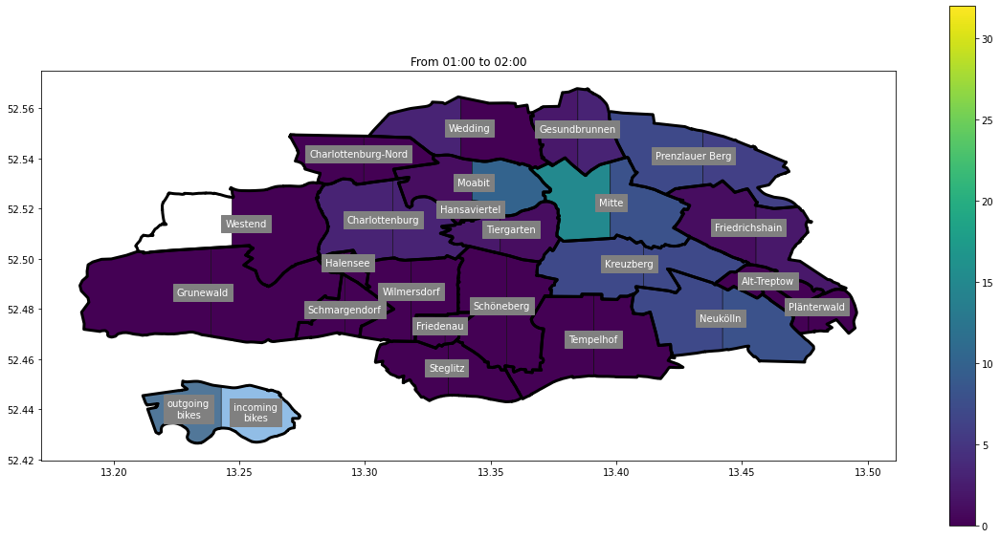

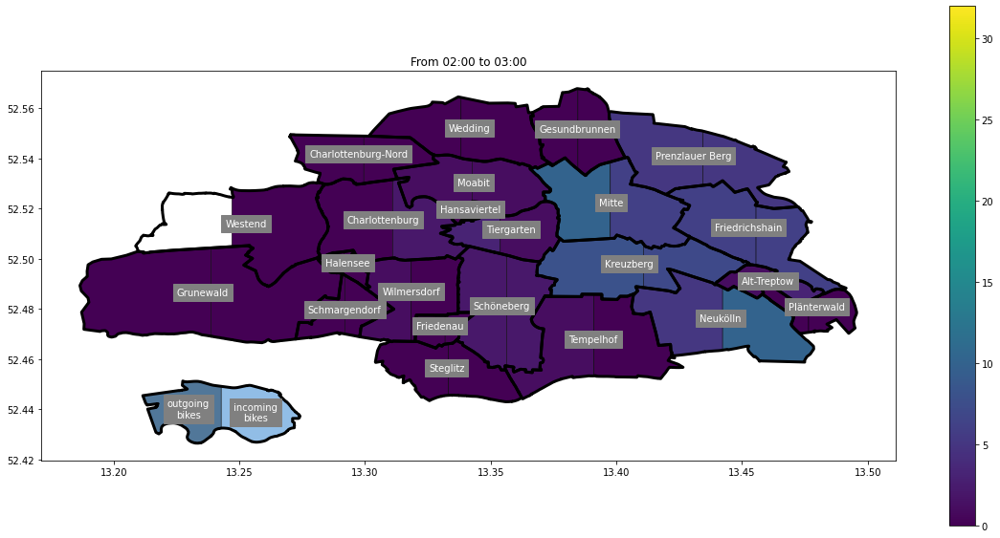

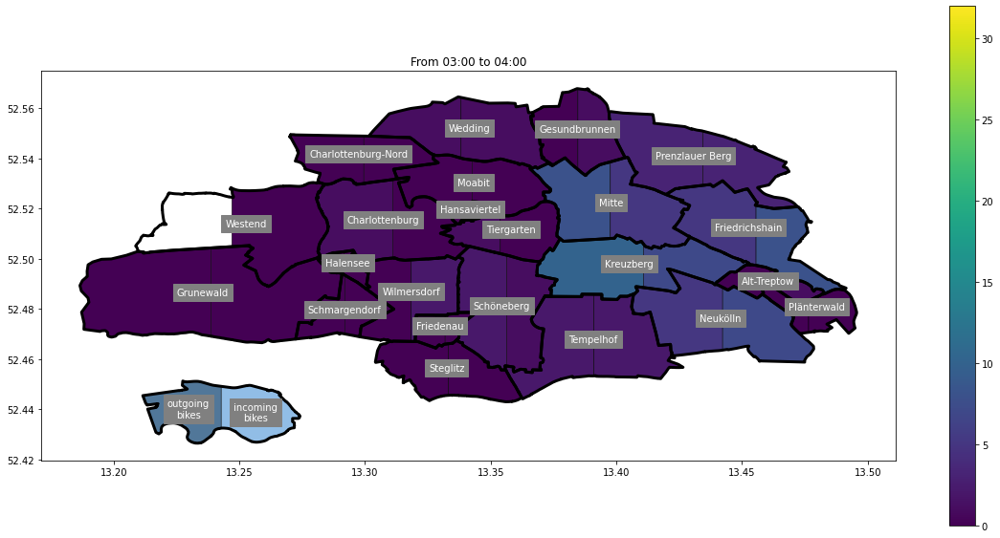

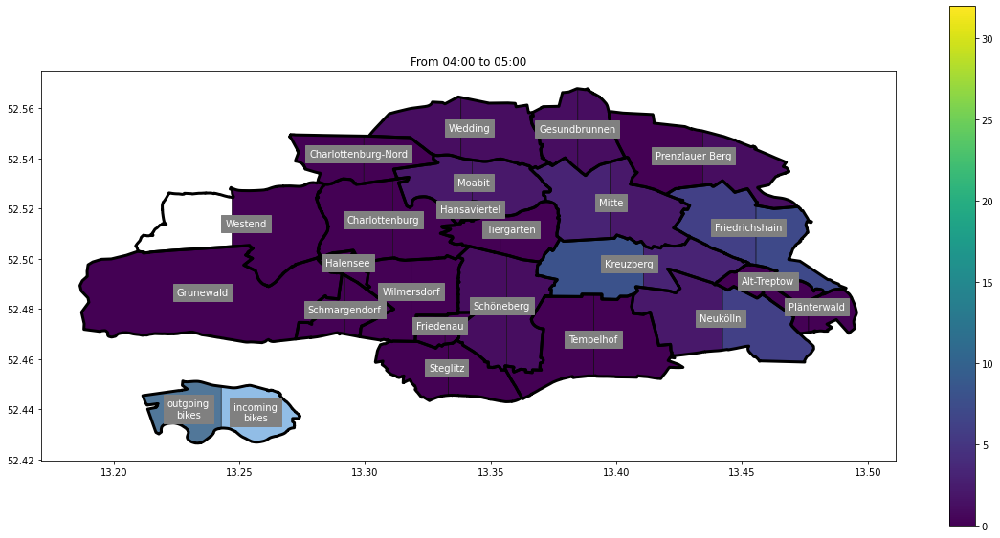

...

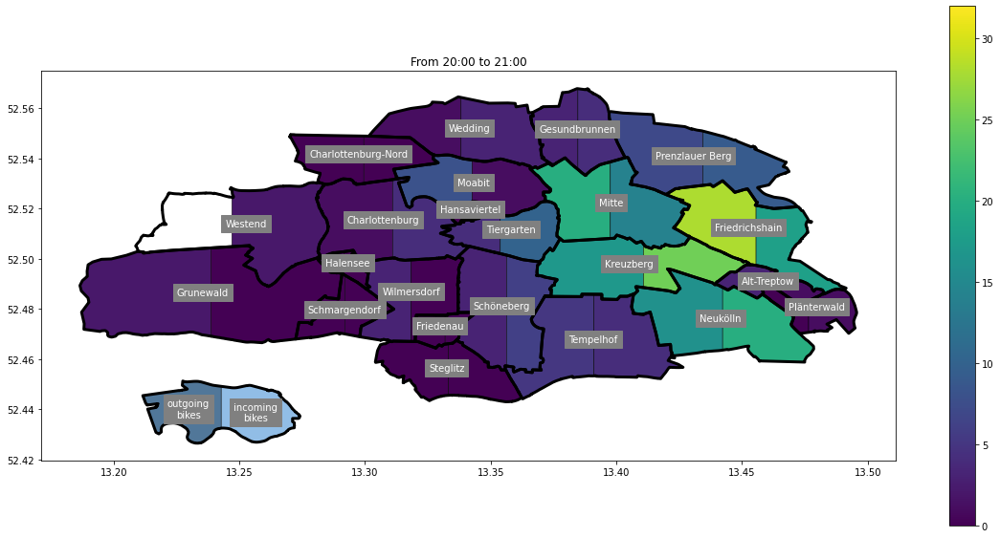

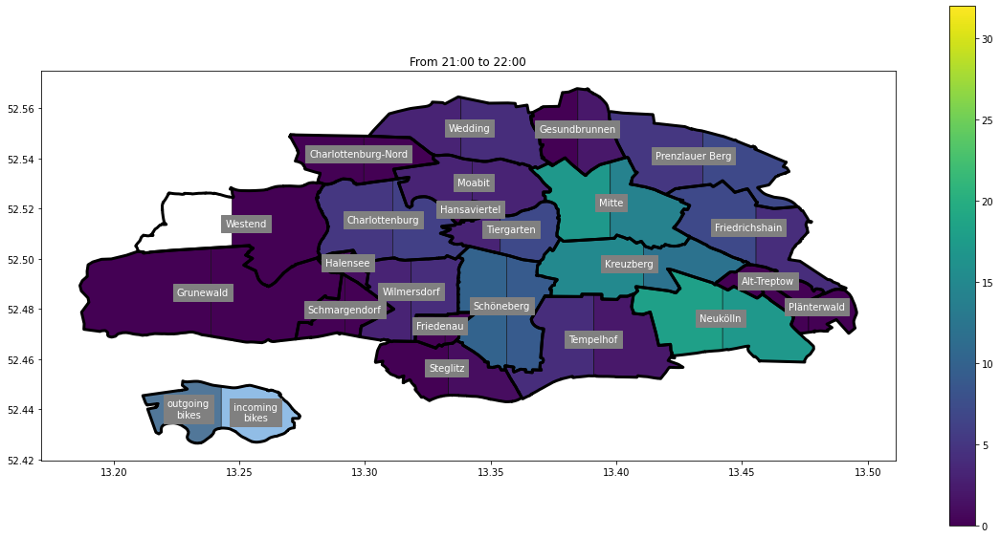

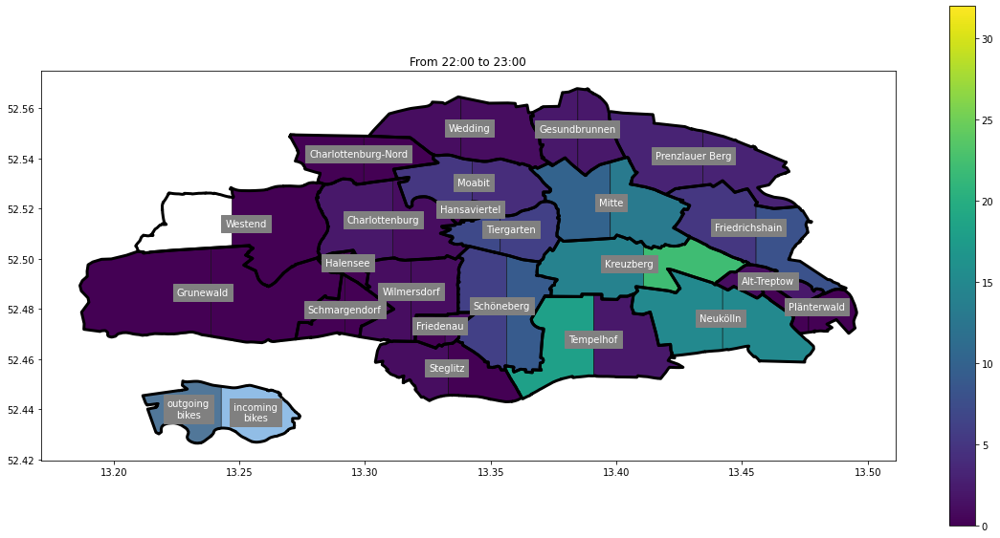

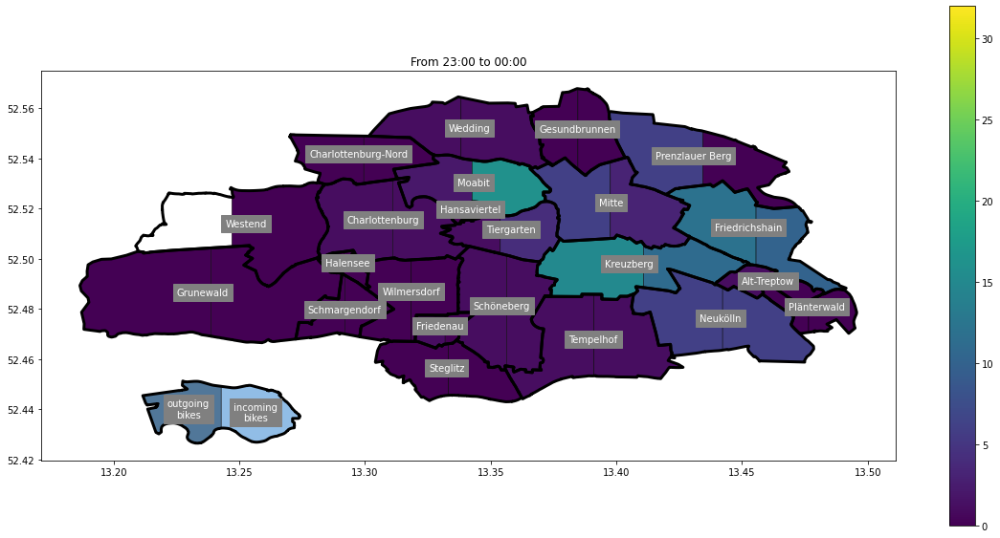

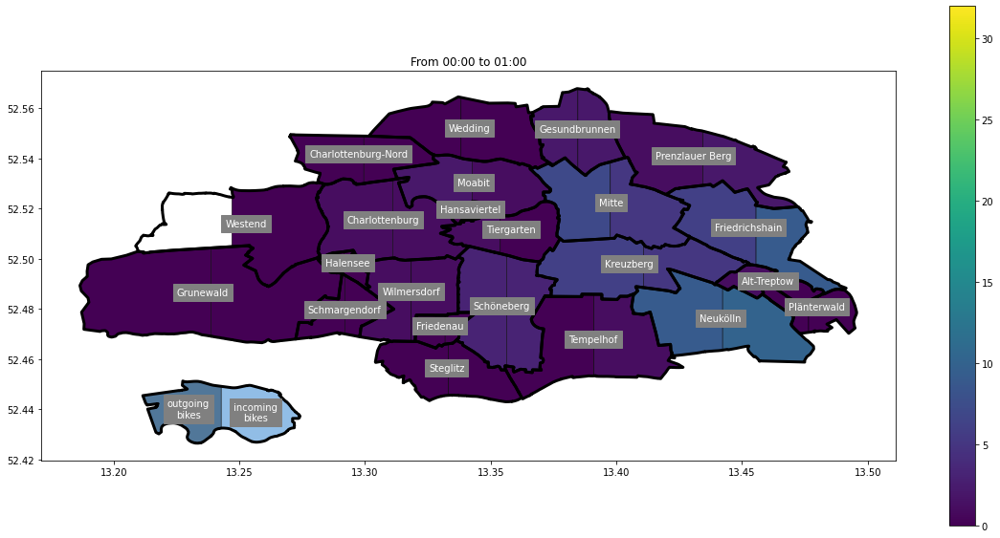

In [62]:
bikeTourAmountStarts = []
bikeTourAmountEnds = []

bikeTours = buildBikeTourPairs(bikeDataFileNames, 6)
# bikeTours = bikeTours[:2]

for bikeTour in bikeTours:
    bikes1, ts1 = loadBikeData(bikeTour[0])
    bikes2, ts2 = loadBikeData(bikeTour[1])
    bikeTour = createBikeTour(bikes1, bikes2, 100)
    bikeTourFiltered = bikeTour[bikeTour.within(unary_union(kiezeIntersectingFlexzone['geometry']))]
    
    
    startPoints = getPointGdfFromLatAndLngDf(bikeTourFiltered[['lat_x', 'lng_x']], 'lat_x', 'lng_x')
    endPoints = getPointGdfFromLatAndLngDf(bikeTourFiltered[['lat_y', 'lng_y']], 'lat_y', 'lng_y')
    
    splittedKieze = kiezeIntersectingFlexzone.apply(lambda x: splitPolygonIntoHalf(x['geometry']), axis=1)

    leftSplitKieze = kiezeIntersectingFlexzone.assign(leftSplit=splittedKieze[0])
    leftSplitKieze.set_geometry('leftSplit', inplace=True)
    rightSplitKieze = kiezeIntersectingFlexzone.assign(rightSplit=splittedKieze[1])
    rightSplitKieze.set_geometry('rightSplit', inplace=True)
    
    leftSplitKieze = leftSplitKieze.assign(tourStartLeftSplitKieze=leftSplitKieze.T.apply(lambda x: startPoints.within(x['geometry']).sum()).values)
    rightSplitKieze = rightSplitKieze.assign(tourStartRigthSplitKieze=rightSplitKieze.T.apply(lambda x: endPoints.within(x['geometry']).sum()).values)

    
    bikeTourAmountStarts.append(leftSplitKieze['tourStartLeftSplitKieze'])
    bikeTourAmountEnds.append(rightSplitKieze['tourStartRigthSplitKieze'])
    
    
    exampleSplit = geopandas.GeoSeries([leftSplitKieze.loc[1]['leftSplit'], rightSplitKieze.loc[1]['rightSplit']])
    exampleSplit = exampleSplit.translate(xoff=-0.1, yoff=-0.09)


    # plot
    leftSplitAx = leftSplitKieze.plot(column='tourStartLeftSplitKieze', cmap='viridis', vmax=32, edgecolor='k', linewidth=0.5, legend=True, figsize=(20,10))
    rightSplitAx = rightSplitKieze.plot(ax = leftSplitAx, column='tourStartRigthSplitKieze', cmap='viridis', vmax=32, edgecolor='k', linewidth=0.5)
    kiezeBorderAx = kiezeIntersectingFlexzone.plot(ax = rightSplitAx, facecolor=(0,0,0,0), edgecolor='k', linewidth=3)
    _ = kiezeIntersectingFlexzone.apply(lambda x: kiezeBorderAx.annotate(text=x['OTEIL'], xy=x.geometry.centroid.coords[0], ha='center', color='white', backgroundcolor='grey'), axis=1)
    kiezeBorderAx.set_title(f"From {getTimeFromTimestamp(ts1)} to {getTimeFromTimestamp(ts2)}")


    exampleSplitLeftAx = exampleSplit[0:1].plot(ax=kiezeBorderAx, color=colors[0], edgecolor='k', linewidth=0.5)
    exampleSplitRightAx = exampleSplit[1:2].plot(ax=kiezeBorderAx, color=colors[2], edgecolor='k', linewidth=0.5)
    _ = geopandas.GeoSeries(unary_union(exampleSplit)).plot(ax=kiezeBorderAx, facecolor=(0,0,0,0), edgecolor='k', linewidth=3)
    _ = exampleSplitLeftAx.annotate(text='outgoing\nbikes', xy=exampleSplit[0].centroid.coords[0], ha='center', va='center',  color='white', backgroundcolor='grey')
    _ = exampleSplitLeftAx.annotate(text='incoming\nbikes', xy=exampleSplit[1].centroid.coords[0], ha='center', va='center', color='white', backgroundcolor='grey')

    plt.savefig(f"export/60_min_tick_tourheat/{getTimeFromTimestamp(ts1)}-{getTimeFromTimestamp(ts2)}")
    



# some statistic

In [201]:
%%time
def loadMultipleBikeData(bikeFilesName):
    bikeData = {}
    for bikeFileName in bikeFilesName:
        with open(bikeFileName, 'r') as file:
            content = json.load(file)
            bikes = content['countries'][0]['cities'][0]['places']
            timestamp = bikeFileName[-15:-5]
            bikeData[timestamp] = pd.DataFrame(bikes)
        
    return bikeData

bikeDataFileNames = loadBikeDataFileNames("data")
bikeDataFrameList = loadMultipleBikeData(bikeDataFileNames[::6])

CPU times: user 12.3 s, sys: 589 ms, total: 12.9 s
Wall time: 18 s


In [202]:
bikesRaw = pd.concat(bikeDataFrameList.values(), keys=bikeDataFrameList.keys())

In [338]:
bikesRaw

uid        lat        lng   bike  \
1661532954 0         44437  52.504157  13.335328  False   
           1         72228  52.496986  13.291210  False   
           2         72229  52.498323  13.296157  False   
           3         72238  52.499137  13.303743  False   
           4         72263  52.500614  13.294401  False   
...                    ...        ...        ...    ...   
1662372004 2649  112146121  52.543342  13.544153   True   
           2650  112146157  52.506080  13.425348   True   
           2651  112146158  52.485036  13.366821   True   
           2652  112146175  52.470293  13.438903   True   
           2653  112146204  52.502391  13.444813   True   

                                          name address   spot  number  \
1661532954 0         virtuell - Kurfürstendamm    None   True    1640   
           1             virtuell - S Halensee    None   True    1670   
           2     Joachim-Friedrich-Str./KuDamm    None   True    1669   
           3          Albrecht-Achilles-Straße    None   True    1672   
           4          Karlsruher Str./Aspria      None   True    1671   
...                                        ...     ...    ...     ...   
1662372004 2649                     BIKE 19001    None  False       0   
           2650                     BIKE 17335    None  False       0   
           2651                     BIKE 10973    None  False       0   
           2652                     BIKE 14026    None  False       0   
           2653                     BIKE 19361    None  False       0   

                 booked_bikes  bikes  ...  special_racks  free_special_racks  \
1661532954 0                0      3  ...              0                   0   
           1                0      1  ...              0                   0   
           2                0      6  ...              0                   0   
           3                0      4  ...              0                   0   
           4                0      6  ...              0                   0   
...                       ...    ...  ...            ...                 ...   
1662372004 2649             0      1  ...              0                   0   
           2650             0      1  ...              0                   0   
           2651             0      1  ...              0                   0   
           2652             0      1  ...              0                   0   
           2653             0      1  ...              0                   0   

                 maintenance  terminal_type  \
1661532954 0           False           free   
           1           False           free   
           2           False     smart_sign   
           3           False     smart_sign   
           4           False     smart_sign   
...                      ...            ...   
1662372004 2649        False                  
           2650        False                  
           2651        False                  
           2652        False                  
           2653        False                  

                                                         bike_list  \
1661532954 0     [{'number': '18125', 'bike_type': 150, 'lock_t...   
           1     [{'number': '16199', 'bike_type': 15, 'lock_ty...   
           2     [{'number': '19283', 'bike_type': 150, 'lock_t...   
           3     [{'number': '15528', 'bike_type': 150, 'lock_t...   
           4     [{'number': '16490', 'bike_type': 196, 'lock_t...   
...                                                            ...   
1662372004 2649  [{'number': '19001', 'bike_type': 150, 'lock_t...   
           2650  [{'number': '17335', 'bike_type': 150, 'lock_t...   
           2651  [{'number': '10973', 'bike_type': 196, 'lock_t...   
           2652  [{'number': '14026', 'bike_type': 196, 'lock_t...   
           2653  [{'number': '19361', 'bike_type': 150, 'lock_t...   

                                               bike_numbers  \
1661532

In [317]:
def getFirstLevelIndexes(df):
    return df.index.get_level_values(0).unique()

def getFirstLevel(df, i):
    firstLevelIndexes = getFirstLevelIndexes(df)
    return df.loc[firstLevelIndexes[i]]

preprocessBikeData(getFirstLevel(bikesRaw, 0)).head(10)

,lat,lng,bike_numbers
0,52.504157,13.335328,18125
0,52.504157,13.335328,14860
0,52.504157,13.335328,13152
1,52.496986,13.291210,16199
2,52.498323,13.296157,19283
2,52.498323,13.296157,13964
2,52.498323,13.296157,19692
2,52.498323,13.296157,19686
2,52.498323,13.296157,19681
2,52.498323,13.296157,19618


In [209]:
%%time
bikeTourList = {}

for i, (start, end) in enumerate(zip(getFirstLevelIndexes(bikesRaw)[:-1], getFirstLevelIndexes(bikesRaw)[1:])):
    bikeTourStartBikes = preprocessBikeData(bikesRaw.loc[start])
    bikeTourEndBikes = preprocessBikeData(bikesRaw.loc[end])
    
    bikeTourList[start] = createBikeTour(bikeTourStartBikes, bikeTourEndBikes, 100)
    


CPU times: user 1min 55s, sys: 111 ms, total: 1min 55s
Wall time: 2min 2s


In [340]:
bikeTours2 = pd.concat(bikeTourList.values(), keys=bikeTourList.keys())
bikeTours2

lat_x      lng_x bike_numbers      lat_y      lng_y  \
1661532954 22    52.484518  13.385526        19696  52.497192  13.380079   
           57    52.525899  13.369702        18489  52.535133  13.349413   
           61    52.525899  13.369702        17226  52.529493  13.344523   
           73    52.500015  13.321258        19345  52.494140  13.302482   
           242   52.520540  13.414945        19494  52.532496  13.399335   
...                    ...        ...          ...        ...        ...   
1662368404 3782  52.546702  13.416860        19703  52.538120  13.420209   
           3784  52.501280  13.420091        15558  52.502760  13.366412   
           3823  52.489747  13.403433        19751  52.486311  13.401202   
           3870  52.536147  13.422204        13917  52.532249  13.418449   
           3871  52.500612  13.421905        13039  52.502323  13.432466   

                                                             lines  \
1661532954 22    LINESTRING (13.38553 52.48452, 13.38008 52.49719)   
           57    LINESTRING (13.36970 52.52590, 13.34941 52.53513)   
           61    LINESTRING (13.36970 52.52590, 13.34452 52.52949)   
           73    LINESTRING (13.32126 52.50001, 13.30248 52.49414)   
           242   LINESTRING (13.41494 52.52054, 13.39934 52.53250)   
...                                                            ...   
1662368404 3782  LINESTRING (13.41686 52.54670, 13.42021 52.53812)   
           3784  LINESTRING (13.42009 52.50128, 13.36641 52.50276)   
           3823  LINESTRING (13.40343 52.48975, 13.40120 52.48631)   
           3870  LINESTRING (13.42220 52.53615, 13.41845 52.53225)   
           3871  LINESTRING (13.42191 52.50061, 13.43247 52.50232)   

                      length  
1661532954 22    1459.044837  
           57    1719.183980  
           61    1756.191995  
           73    1433.916914  
           242   1701.909676  
...                      ...  
1662368404 3782   982.330991  
           3784  3651.426956  
           3823   411.572033  
           3870   503.417312  
           3871   742.544134  

[23083 rows x 7 columns]

### only count bike tours that are in berlin

In [341]:
%%time
filteredBikeTours = bikeTours2[bikeTours2.within(unary_union(kieze['geometry']))]

CPU times: user 33.2 s, sys: 28.8 ms, total: 33.2 s
Wall time: 38.9 s


In [343]:
# bike tours vs bike tours only in berlin polygon
len(bikeTours), len(filteredBikeTours) 

(23083, 22974)

In [344]:
startTimestamp = filteredBikeTours.index[0][0]
endTimestamp = filteredBikeTours.index[-1][0]

startTimestampString = getDateTimeFromTimeStamp(startTimestamp).strftime("%d-%m-%y %H:%M:%S")
endTimestampString = getDateTimeFromTimeStamp(endTimestamp).strftime("%d-%m-%y %H:%M:%S")

print(f"Start: {startTimestampString} End:{endTimestampString}")

Start: 26-08-22 18:55:54 End:05-09-22 11:00:04


In [345]:
filteredBikeTours.groupby('bike_numbers')['length'].count().describe()

count    3759.000000
mean        6.111732
std         3.961868
min         1.000000
25%         3.000000
50%         5.000000
75%         9.000000
max        35.000000
Name: length, dtype: float64

In [346]:
# per one tour
filteredBikeTours['length'].describe()

count    22974.000000
mean      2052.653278
std       1473.353065
min        100.032328
25%        979.949659
50%       1746.904628
75%       2805.159812
max      13965.488980
Name: length, dtype: float64

In [347]:
# sum of all tours for each bike
filteredBikeTours.groupby('bike_numbers')['length'].sum().describe()

count     3759.000000
mean     12545.266404
std       8985.855832
min        100.745455
25%       5481.430975
50%      10900.799483
75%      17879.115371
max      58961.029127
Name: length, dtype: float64

In [332]:
# per bike per tour
(filteredBikeTours.groupby('bike_numbers')['length'].sum() / filteredBikeTours.groupby('bike_numbers')['length'].count()).describe()

count     3759.000000
mean      2058.045987
std        914.525207
min        100.745455
25%       1540.385388
50%       1975.048344
75%       2480.951615
max      11963.768986
Name: length, dtype: float64

In [333]:
# longest bike tour
filteredBikeTours['length'].sort_values(ascending=False).head(10)

1661720402  1370    13965.488980
1661724002  1311    13965.488980
1661572802  1322    13072.416703
1661551202  721     13072.416703
1661562002  1433    13070.677653
1661551202  722     13070.677653
1661796003  2022    11963.768986
1662109203  2591    11526.226811
1662098403  3468    11102.246279
1662033603  3832    10884.623501
Name: length, dtype: float64

<AxesSubplot:>

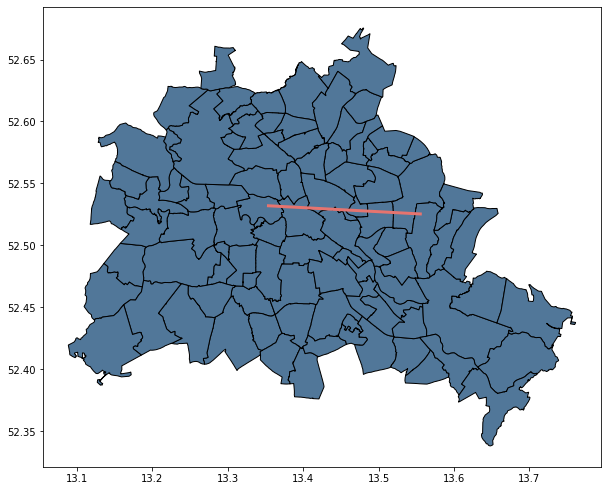

In [334]:
ax = kieze.plot(color=colors[0], edgecolor='k', figsize=(10,10))
filteredBikeTours.loc['1661720402'].loc[[1370]].plot(color=colors[1], linewidth=3, ax=ax)

In [348]:
# bike with the most bike tours
filteredBikeTours.groupby('bike_numbers')['length'].count().sort_values(ascending=False).head(20)

bike_numbers
16430    35
19012    33
18165    25
14268    25
18152    23
19652    23
18033    22
15714    22
17755    21
15425    21
18160    21
14382    21
16469    20
15125    20
19698    20
14909    20
18932    20
15635    19
15650    19
17984    19
Name: length, dtype: int64

,,lat_x,lng_x,bike_numbers,lat_y,lng_y,lines,length,tourIndex
1661540404,3059,52.480836,13.388781,16430,52.480520,13.390334,"LINESTRING (13.38878 52.48084, 13.39033 52.48052)",111.292775,0
1661544002,3422,52.480520,13.390334,16430,52.480396,13.388658,"LINESTRING (13.39033 52.48052, 13.38866 52.48040)",114.780179,1
1661562002,3739,52.480578,13.388737,16430,52.480427,13.391610,"LINESTRING (13.38874 52.48058, 13.39161 52.48043)",196.049610,2
1661576403,3306,52.480427,13.391610,16430,52.480231,13.388389,"LINESTRING (13.39161 52.48043, 13.38839 52.48023)",220.072534,3
1661598004,3443,52.480462,13.388474,16430,52.476489,13.390501,"LINESTRING (13.38847 52.48046, 13.39050 52.47649)",463.375526,4
1661605203,3274,52.476476,13.390530,16430,52.481338,13.405748,"LINESTRING (13.39053 52.47648, 13.40575 52.48134)",1167.758450,5
1661608803,3522,52.481338,13.405748,16430,52.483196,13.402701,"LINESTRING (13.40575 52.48134, 13.40270 52.48320)",292.774875,6
1661612402,3521,52.483196,13.402701,16430,52.480031,13.393297,"LINESTRING (13.40270 52.48320, 13.39330 52.48003)",730.043348,7
1661626802,3563,52.479956,13.393248,16430,52.482227,13.402453,"LINESTRING (13.39325 52.47996, 13.40245 52.48223)",674.978843,8
1661630403,3602,52.482227,13.402453,16430,52.480813,13.401853,"LINESTRING (13.40245 52.48223, 13.40185 52.48081)",162.652686,9


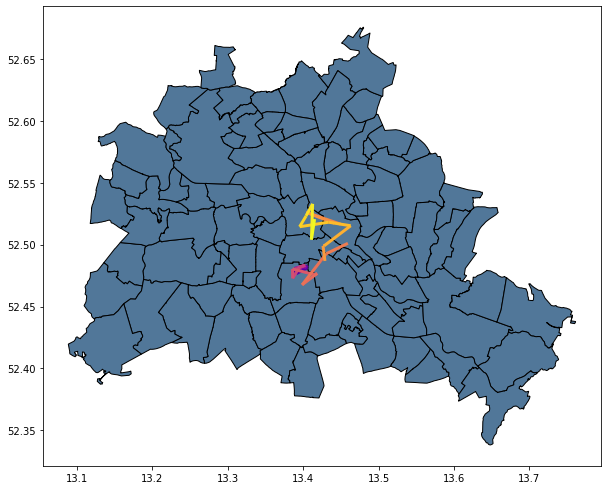

In [355]:
def visualizeBikeTour(bikenumber):
    tour = filteredBikeTours[filteredBikeTours['bike_numbers'] == bikenumber]
    tour = tour.assign(tourIndex=np.arange(len(tour)))
    
    ax = kieze.plot(color=colors[0], edgecolor='k', figsize=(10,10))
    tour.plot(ax=ax, column='tourIndex', cmap='plasma', linewidth=3)
    
    return tour
    
visualizeBikeTour('16430')

# bike tours of arbitrary bikes

,lat,lng,bike_numbers,lat_next,lng_next,bike_numbers,i,lines
0,52.484518,13.385526,19696,52.497192,13.380079,19696,"(1661532954, 5)","LINESTRING (13.385526 52.484518, 13.380079 52...."
1,52.497192,13.380079,19696,52.497192,13.380079,19696,"(1661536804, 87)","LINESTRING (13.380079 52.497192, 13.380079 52...."
2,52.497192,13.380079,19696,52.489249,13.391882,19696,"(1661540404, 87)","LINESTRING (13.380079 52.497192, 13.391882 52...."
3,52.489249,13.391882,19696,52.489249,13.391882,19696,"(1661544002, 2380)","LINESTRING (13.391882 52.489249, 13.391882 52...."
4,52.489249,13.391882,19696,52.489249,13.391882,19696,"(1661547601, 2091)","LINESTRING (13.391882 52.489249, 13.391882 52...."
...,...,...,...,...,...,...,...,...
203,52.528636,13.393997,19696,52.528636,13.393997,19696,"(1662354005, 1036)","LINESTRING (13.393997 52.528636, 13.393997 52...."
204,52.528636,13.393997,19696,52.528636,13.393997,19696,"(1662357603, 999)","LINESTRING (13.393997 52.528636, 13.393997 52...."
205,52.528636,13.393997,19696,52.528636,13.393997,19696,"(1662361201, 963)","LINESTRING (13.393997 52.528636, 13.393997 52...."
206,52.528636,13.393997,19696,52.528551,13.394283,19696,"(1662364801, 939)","LINESTRING (13.393997 52.528636, 13.394283 52...."


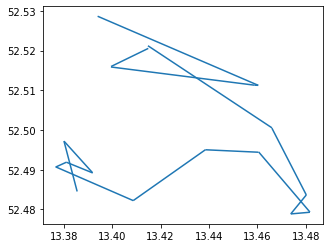

In [363]:
def analzeTour(bikes, bikeNumber, minLength):
#     bikes = bikes.reset_index()
    bikeLocations = bikes.explode('bike_numbers')
    bikeLocations = bikeLocations[(bikeLocations['bike_numbers'] == bikeNumber)][['lat', 'lng', 'bike_numbers']]
    i = bikeLocations.index

    b = pd.concat([bikeLocations[:-1].reset_index(drop=True), bikeLocations[1:].reset_index(drop=True).rename({'lat':'lat_next', 'lng':'lng_next'}, axis=1)], axis=1)
    b = b.assign(i=i[:-1])
    
    dfLines = b.apply(lambda x: LineString([(x['lng'], x['lat']), (x['lng_next'], x['lat_next'])]), axis=1)
    b['lines'] = dfLines
    
    gdf = geopandas.GeoDataFrame(b, geometry='lines', crs="EPSG:4326")
    gdf['length'] = gdf['lines'].to_crs(crs="EPSG:25832").length # first project to meter than get length    
    gdf = gdf[gdf['length'] > minLength] # remove bikes that moved under 100 meters
    gdf.plot()
    
    return b

analzeTour(bikesRaw, '19696', 100)

,,lat_x,lng_x,bike_numbers,lat_y,lng_y,lines,length,tourIndex
1661532954,22,52.484518,13.385526,19696,52.497192,13.380079,"LINESTRING (13.38553 52.48452, 13.38008 52.49719)",1459.044837,0
1661540404,407,52.497192,13.380079,19696,52.489249,13.391882,"LINESTRING (13.38008 52.49719, 13.39188 52.48925)",1194.093387,1
1661619602,2469,52.489187,13.391956,19696,52.491884,13.381071,"LINESTRING (13.39196 52.48919, 13.38107 52.49188)",798.498901,2
1661623203,3536,52.491884,13.381071,19696,52.490667,13.376648,"LINESTRING (13.38107 52.49188, 13.37665 52.49067)",329.764090,3
1661752804,909,52.495018,13.438551,19696,52.494400,13.460512,"LINESTRING (13.43855 52.49502, 13.46051 52.49440)",1494.214782,4
1661781603,3419,52.494467,13.460596,19696,52.479338,13.481799,"LINESTRING (13.46060 52.49447, 13.48180 52.47934)",2217.185108,5
1661961602,2768,52.479289,13.481806,19696,52.478868,13.473875,"LINESTRING (13.48181 52.47929, 13.47387 52.47887)",541.281746,6
1662044401,1395,52.478868,13.473875,19696,52.483644,13.480300,"LINESTRING (13.47387 52.47887, 13.48030 52.48364)",688.244720,7
1662055201,3068,52.483644,13.480300,19696,52.500467,13.466064,"LINESTRING (13.48030 52.48364, 13.46606 52.50047)",2108.528792,8
1662231603,3579,52.515862,13.399500,19696,52.511280,13.458864,"LINESTRING (13.39950 52.51586, 13.45886 52.51128)",4065.184702,9


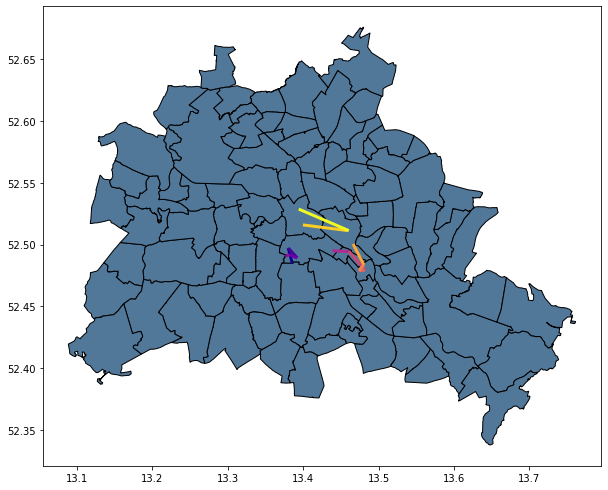

In [356]:
visualizeBikeTour('19696')

# correlate weather with bike data

In [82]:
weather = pd.read_csv('berlin 2022-08-26 to 2022-09-09.csv')

In [323]:
bikesRaw

uid        lat        lng   bike  \
1661532954 0         44437  52.504157  13.335328  False   
           1         72228  52.496986  13.291210  False   
           2         72229  52.498323  13.296157  False   
           3         72238  52.499137  13.303743  False   
           4         72263  52.500614  13.294401  False   
...                    ...        ...        ...    ...   
1662372004 2649  112146121  52.543342  13.544153   True   
           2650  112146157  52.506080  13.425348   True   
           2651  112146158  52.485036  13.366821   True   
           2652  112146175  52.470293  13.438903   True   
           2653  112146204  52.502391  13.444813   True   

                                          name address   spot  number  \
1661532954 0         virtuell - Kurfürstendamm    None   True    1640   
           1             virtuell - S Halensee    None   True    1670   
           2     Joachim-Friedrich-Str./KuDamm    None   True    1669   
           3          Albrecht-Achilles-Straße    None   True    1672   
           4          Karlsruher Str./Aspria      None   True    1671   
...                                        ...     ...    ...     ...   
1662372004 2649                     BIKE 19001    None  False       0   
           2650                     BIKE 17335    None  False       0   
           2651                     BIKE 10973    None  False       0   
           2652                     BIKE 14026    None  False       0   
           2653                     BIKE 19361    None  False       0   

                 booked_bikes  bikes  ...  special_racks  free_special_racks  \
1661532954 0                0      3  ...              0                   0   
           1                0      1  ...              0                   0   
           2                0      6  ...              0                   0   
           3                0      4  ...              0                   0   
           4                0      6  ...              0                   0   
...                       ...    ...  ...            ...                 ...   
1662372004 2649             0      1  ...              0                   0   
           2650             0      1  ...              0                   0   
           2651             0      1  ...              0                   0   
           2652             0      1  ...              0                   0   
           2653             0      1  ...              0                   0   

                 maintenance  terminal_type  \
1661532954 0           False           free   
           1           False           free   
           2           False     smart_sign   
           3           False     smart_sign   
           4           False     smart_sign   
...                      ...            ...   
1662372004 2649        False                  
           2650        False                  
           2651        False                  
           2652        False                  
           2653        False                  

                                                         bike_list  \
1661532954 0     [{'number': '18125', 'bike_type': 150, 'lock_t...   
           1     [{'number': '16199', 'bike_type': 15, 'lock_ty...   
           2     [{'number': '19283', 'bike_type': 150, 'lock_t...   
           3     [{'number': '15528', 'bike_type': 150, 'lock_t...   
           4     [{'number': '16490', 'bike_type': 196, 'lock_t...   
...                                                            ...   
1662372004 2649  [{'number': '19001', 'bike_type': 150, 'lock_t...   
           2650  [{'number': '17335', 'bike_type': 150, 'lock_t...   
           2651  [{'number': '10973', 'bike_type': 196, 'lock_t...   
           2652  [{'number': '14026', 'bike_type': 196, 'lock_t...   
           2653  [{'number': '19361', 'bike_type': 150, 'lock_t...   

                                               bike_numbers  \
1661532

In [83]:
weather

,datetime,temp,feelslike,dew,humidity,precip,precipprob,preciptype,snow,snowdepth,windgust,windspeed,winddir,sealevelpressure,cloudcover,visibility,solarradiation,solarenergy,uvindex,severerisk
0,2022-08-26T00:00:00,21.1,21.1,18.1,82.79,0.0,0.0,NaN,0,0,13.0,7.2,75.0,1016.1,0.0,34.4,0,NaN,0,10
1,2022-08-26T01:00:00,21.2,21.2,18.3,83.38,0.0,0.0,NaN,0,0,11.5,7.4,63.0,1015.8,56.9,34.5,0,NaN,0,10
2,2022-08-26T02:00:00,21.0,21.0,18.1,83.07,0.0,0.0,NaN,0,0,16.9,5.4,16.0,1015.4,87.2,30.1,0,NaN,0,3
3,2022-08-26T03:00:00,20.6,20.6,17.8,84.16,0.0,0.0,NaN,0,0,15.1,5.2,34.0,1015.1,13.0,29.7,0,NaN,0,3
4,2022-08-26T04:00:00,20.7,20.7,18.0,84.61,0.0,0.0,NaN,0,0,11.2,5.8,32.0,1015.0,34.5,20.7,0,NaN,0,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
355,2022-09-09T19:00:00,19.6,19.6,14.3,71.46,0.0,76.2,rain,0,0,19.1,7.6,151.3,1012.0,99.2,24.1,7,0.0,0,10
356,2022-09-09T20:00:00,18.4,18.4,14.9,80.06,0.0,76.2,rain,0,0,17.6,5.8,151.1,1012.0,27.4,22.3,5,0.0,0,10
357,2022-09-09T21:00:00,17.3,17.3,14.7,84.70,0.0,57.1,rain,0,0,13.7,6.1,163.2,1012.0,26.9,24.1,0,NaN,0,10
358,2022-09-09T22:00:00,16.5,16.5,14.5,87.97,0.0,57.1,rain,0,0,16.9,7.6,162.2,1012.0,70.7,24.1,0,NaN,0,10
